In [52]:
# Importing Libraries
import os
import random
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from tqdm.auto import tqdm
from timeit import default_timer as timer
import cv2
import pytesseract
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.utils.data import DataLoader,random_split
from torchvision import transforms, datasets

In [53]:
## Function to go through the files.
def walk_through_dir(dir_path):
  """
  Walks through dir_path returning its contents.
  Args:
    dir_path (str or pathlib.Path): target directory

  Returns:
    A print out of:
      number of subdiretories in dir_path
      number of images (files) in each subdirectory
      name of each subdirectory
  """
  for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

In [54]:
walk_through_dir("/kaggle/input/iam-handwritten-forms-dataset")

There are 1 directories and 1 images in '/kaggle/input/iam-handwritten-forms-dataset'.
There are 657 directories and 0 images in '/kaggle/input/iam-handwritten-forms-dataset/data'.
There are 0 directories and 1 images in '/kaggle/input/iam-handwritten-forms-dataset/data/515'.
There are 0 directories and 5 images in '/kaggle/input/iam-handwritten-forms-dataset/data/248'.
There are 0 directories and 1 images in '/kaggle/input/iam-handwritten-forms-dataset/data/625'.
There are 0 directories and 2 images in '/kaggle/input/iam-handwritten-forms-dataset/data/135'.
There are 0 directories and 1 images in '/kaggle/input/iam-handwritten-forms-dataset/data/479'.
There are 0 directories and 1 images in '/kaggle/input/iam-handwritten-forms-dataset/data/183'.
There are 0 directories and 1 images in '/kaggle/input/iam-handwritten-forms-dataset/data/642'.
There are 0 directories and 1 images in '/kaggle/input/iam-handwritten-forms-dataset/data/313'.
There are 0 directories and 1 images in '/kaggle/in

In [55]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

In [57]:
path = Path("/kaggle/input/iam-handwritten-forms-dataset")
data_path = path/"data"

Random Image Path : /kaggle/input/iam-handwritten-forms-dataset/data/079/a06-090.png
Image Class : 079
Image Height : 3542
Image Width : 2479


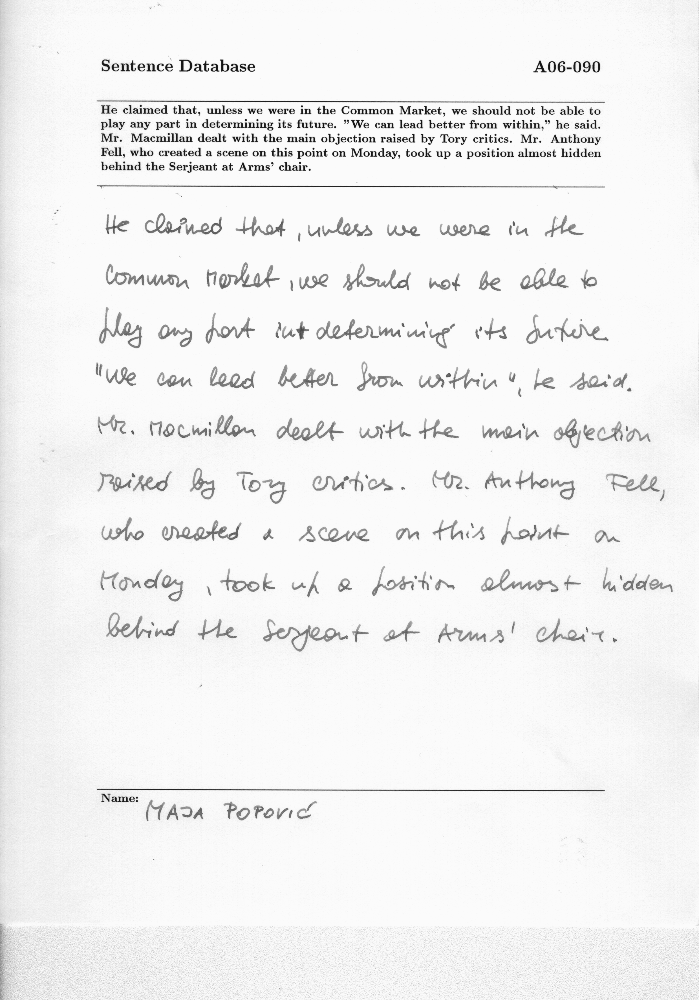

In [58]:
image_path_list = list(data_path.glob("*/*"))
random_image_path = random.choice(image_path_list)

image_class = random_image_path.parent.stem

img = Image.open(random_image_path)

print(f"Random Image Path : {random_image_path}")
print(f"Image Class : {image_class}")
print(f"Image Height : {img.height}")
print(f"Image Width : {img.width}")
img

In [61]:
image_transforms = transforms.Compose([
    transforms.Grayscale(num_output_channels = 1),
    transforms.Resize((128,128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,),(0.5,))
])
image_transforms

Compose(
    Grayscale(num_output_channels=1)
    Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=(0.5,), std=(0.5,))
)

In [63]:
def plot_transformed_image(image_paths,transform,n=3,seed=42):
    random.seed(seed)
    random_image_paths = random.sample(image_paths,k=n)
    for image_path in random_image_paths:
        with Image.open(image_path) as f:
            fig,ax = plt.subplots(1,2)
            ax[0].imshow(f)
            ax[0].set_title(f"Original Size : {f.size}")
            ax[0].axis(False)
            transformed_image = transform(f).permute(1,2,0)
            ax[1].imshow(transformed_image)
            ax[1].set_title(f"Transformed \nsize : {transformed_image.shape}")
            ax[1].axis(False)
            
            fig.suptitle(f"Class : {image_path.parent.stem}",fontsize = 16)


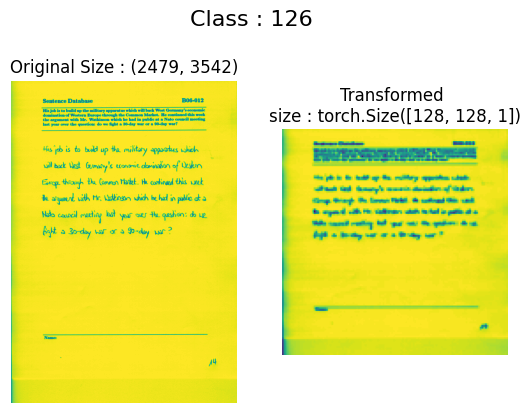

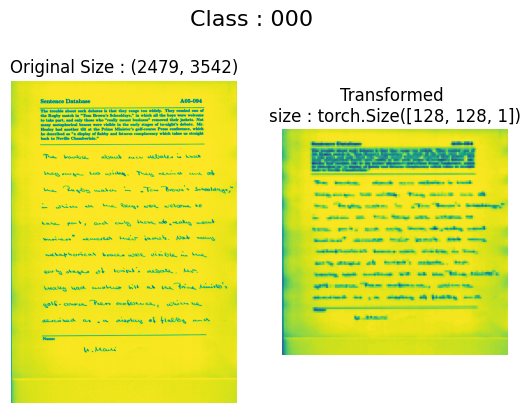

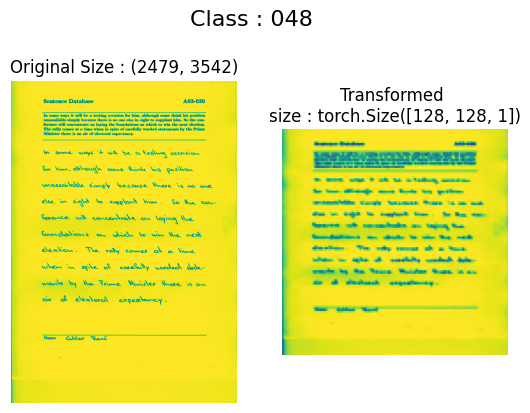

In [64]:
plot_transformed_image(image_path_list,image_transforms)

In [65]:
train_data = datasets.ImageFolder(root = data_path,
                                 transform = image_transforms,
                                 target_transform = None)
train_data

Dataset ImageFolder
    Number of datapoints: 1539
    Root location: /kaggle/input/iam-handwritten-forms-dataset/data
    StandardTransform
Transform: Compose(
               Grayscale(num_output_channels=1)
               Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=(0.5,), std=(0.5,))
           )

In [66]:
## Splitting Data for Faster Experiment.
"""subset_size = 250
dataset_size = len(train_data)

if subset_size > dataset_size:
    subset_size = dataset_size

# Split the dataset into subset and remaining
subset, _ = random_split(train_data, [subset_size, dataset_size - subset_size])
"""

'subset_size = 250\ndataset_size = len(train_data)\n\nif subset_size > dataset_size:\n    subset_size = dataset_size\n\n# Split the dataset into subset and remaining\nsubset, _ = random_split(train_data, [subset_size, dataset_size - subset_size])\n'

In [67]:
val_size = int(0.2 * len(train_data))  # 20% of the data for validation
train_size = len(train_data) - val_size

train_subset, val_subset = random_split(train_data, [train_size, val_size])

In [68]:
len(train_subset) , len(val_subset)

(1232, 307)

In [69]:
## Creating DataLoaders
train_dataloader = DataLoader(dataset = train_subset,
                             batch_size = 32,
                             shuffle=True,
                             num_workers = os.cpu_count())
val_dataloader = DataLoader(dataset = val_subset,
                           batch_size = 32,
                           shuffle = False,
                           num_workers = os.cpu_count())

train_dataloader , val_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x7c222ed717e0>,
 <torch.utils.data.dataloader.DataLoader at 0x7c2238477250>)

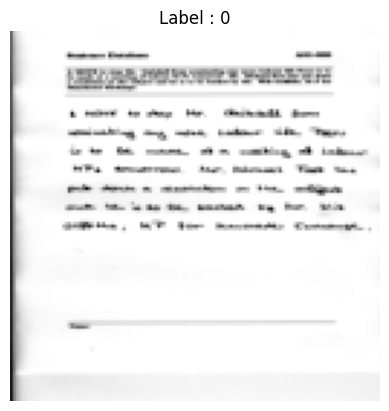

In [70]:
image,label = train_data[0]
plt.imshow(transforms.ToPILImage()(image),cmap="gray")
plt.title(f"Label : {label}")
plt.axis(False)
plt.show()

In [71]:
## Creating Preprocess_image to improve image quality before extracting text
def preprocess_image(image):
    if image.mode != 'RGB':
        image = image.convert('RGB')
    
    image_array = np.array(image)
    
    gray_image = cv2.cvtColor(image_array,cv2.COLOR_RGB2GRAY)
    
    _,thresh_image = cv2.threshold(gray_image,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    return thresh_image

def extract_text_from_image(image):
    preprocessed_image = preprocess_image(image)
    pil_image = Image.fromarray(preprocessed_image)
    text = pytesseract.image_to_string(pil_image,config='--psm 11')
    return text.strip()

In [72]:
image_path_list = list(data_path.glob("*/*"))
random_image_path = random.choice(image_path_list)
image = Image.open(random_image_path)

extracted_text = extract_text_from_image(image)
print(f"Extracted Image : {extracted_text}")

Extracted Image : Sentence Database

A06-090

play any part in determining its future. We can lead better from within,” he said.

He claimed that, unless we were in the Common Market, we should not be able to

Mr. Macmillan dealt with the main objection raised by Tory critics. Mr. Anthony

Fell, who created a scene on this point on Monday, took up a position almost hidden

behind the Serjeant at Arms’ chair.

le Defued Hhod unless we swore in He

Comma, trksk use should not be oble 6

Mas Ory fot lut oledenwu' iii” we gatare.

"We ton bead beher Son urttrir! le 40rd,

Hr. tocmilln oleogkt wit te man oiechin

Preined bey toy oniticn. Ctr. hu Hong Feth,

Uso uregted 2 Acove am tts poe wn

Condlay \ took uk 2 poritin ahunrst ly'deer

Belind te seyeon.t of Kuma! Chai,

Names (Ara PoPovicl


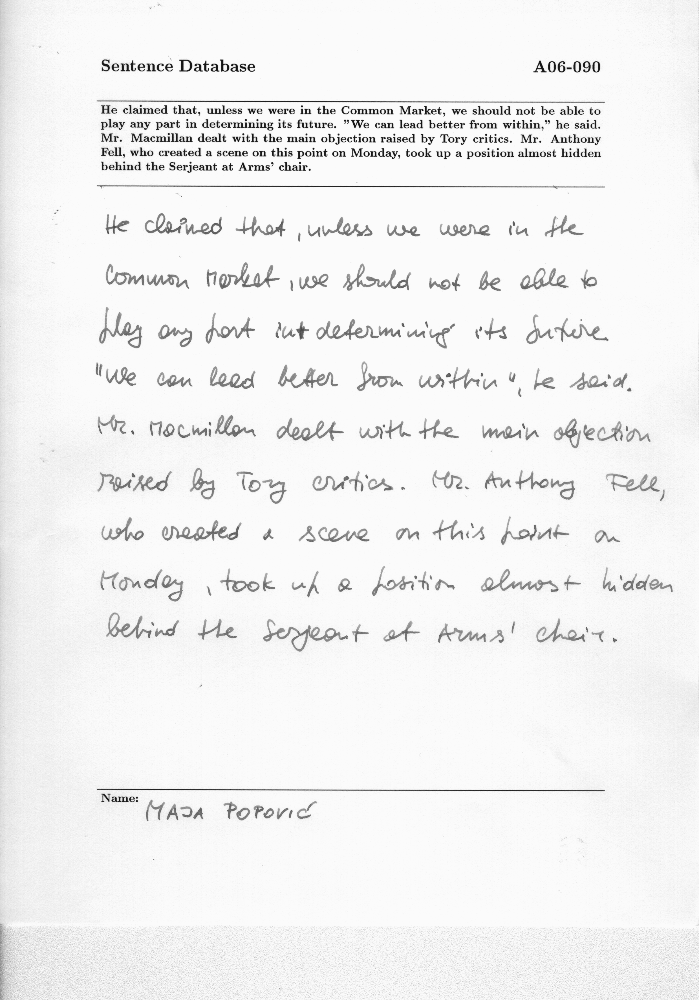

In [73]:
image

In [74]:
## HandWritingRNN class
class HandWritingRNN(nn.Module):
    def __init__(self,
                input_shape : int,
                hidden_units : int,
                output_shape : int,
                num_layers : int = 1):
        super(HandWritingRNN,self).__init__()
        self.hidden_units = hidden_units
        self.num_layers = num_layers
        self.RNN = nn.LSTM(input_shape,
                          hidden_units,
                          num_layers,
                          batch_first = True)
        self.FC = nn.Linear(hidden_units,
                           output_shape)
    def forward(self,x,hidden):
        out,hidden = self.RNN(x,hidden)
        out = self.FC(out)
        return out,hidden
    
    def init_hidden(self,batch_size,device):
        return (torch.zeros(self.num_layers,batch_size,self.hidden_units,device = device),
               torch.zeros(self.num_layers,batch_size,self.hidden_units,device = device))

In [75]:
def train_step(model :torch.nn.Module,
              dataloader : torch.utils.data.DataLoader,
              loss_fn : torch.nn.Module,
              optimizer : torch.optim.Optimizer,
              device : torch.device):
    model.train()
    train_loss = 0.0 
    
    for X,_ in dataloader:
        X = X.to(device)
        
        batch_size,channels,height,width = X.size()
        X = X.view(batch_size,-1) # Flatting Image
        X = X.unsqueeze(1) # Adding Sequence Dimension
        
        hidden = model.init_hidden(X.size(0),device)
        
        optimizer.zero_grad()
        
        outputs, _ = model(X,hidden)
        
        outputs = outputs.squeeze(1) 
        targets = X.view(X.size(0),-1) # flatting the targets
        
        loss = loss_fn(outputs , targets)
        
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        
    return train_loss / len(dataloader)

In [76]:
def test_step(model : torch.nn.Module,
             dataloader : torch.utils.data.DataLoader,
             loss_fn : torch.nn.Module,
             device = torch.device):
    model.eval()
    test_loss = 0.0 
    with torch.inference_mode():
        for X,_ in dataloader:
            X = X.to(device)
            
            batch_size,channels,height,width = X.size()
            X = X.view(batch_size,-1)
            X = X.unsqueeze(1)
            
            hidden = model.init_hidden(X.size(0),device)
            
            outputs, _ = model(X, hidden)

            # Flatten outputs and targets
            outputs = outputs.squeeze(1)  # Remove sequence dimension
            targets = X.view(X.size(0), -1)  # Flatten targets

            loss = loss_fn(outputs, targets)
            test_loss += loss.item()
    return test_loss / len(dataloader)

In [78]:
def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          val_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          device: torch.device,
          epochs: int = 5):
    model.to(device)
    results = {"train_loss": [],
               "val_loss": []}
    
    for epoch in range(epochs):
        train_loss = train_step(model, train_dataloader, loss_fn, optimizer, device)
        val_loss = test_step(model, val_dataloader, loss_fn, device)
        
        print(f"Epoch: {epoch + 1} | train_loss: {train_loss:.3f} | val_loss: {val_loss:.3f}")
        results["train_loss"].append(train_loss)
        results["val_loss"].append(val_loss)
    
    return results

In [79]:
input_shape = 128*128
output_shape = input_shape
hidden_units = 256
num_layers = 2
model = HandWritingRNN(input_shape = input_shape,
                      output_shape = output_shape,
                      hidden_units = hidden_units,
                      num_layers = num_layers)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(),lr=0.002)
torch.manual_seed(42)
torch.cuda.manual_seed(42)

start_time = timer()

model_results = train(model, train_dataloader, val_dataloader, optimizer, loss_fn, epochs=5, device=device)

end_time = timer()

print(f"Total Training Time : {end_time - start_time:.3f}seconds")

Epoch: 1 | train_loss: 0.128 | val_loss: 0.015
Epoch: 2 | train_loss: 0.010 | val_loss: 0.010
Epoch: 3 | train_loss: 0.009 | val_loss: 0.010
Epoch: 4 | train_loss: 0.009 | val_loss: 0.010
Epoch: 5 | train_loss: 0.009 | val_loss: 0.010
Total Training Time : 454.192seconds


In [80]:
import torch.nn.functional as F
def sample(predictions, temperature=1.0):
    predictions = predictions / temperature
    probabilities = F.softmax(predictions, dim=-1)
    return torch.multinomial(probabilities, 1).item()

In [81]:
import torch.nn.functional as F
def generate_text(model, seed_text, max_length, device, temperature=1.0):
    model.eval()
    generated_text = seed_text
    
    # Converting Textv into tensor
    seed_tensor = torch.tensor([ord(char) for char in seed_text], dtype=torch.float32).unsqueeze(0).to(device)

    if seed_tensor.size(-1) < 16384:
        padding_size = 16384 - seed_tensor.size(-1)
        seed_tensor = F.pad(seed_tensor, (0, padding_size), 'constant', 0)
    else:
        seed_tensor = seed_tensor[:, :16384]
    
    seed_tensor = seed_tensor.unsqueeze(1)  

    hidden = model.init_hidden(seed_tensor.size(0), device)

    print(f"Initial seed_tensor shape: {seed_tensor.shape}")
    print(f"Initial Hidden state shape: {hidden[0].shape}, {hidden[1].shape}")

    with torch.no_grad():
        for _ in range(max_length):
            output, hidden = model(seed_tensor, hidden)

            output = output.squeeze(1) 
            predictions = output[-1] 

            predicted_char_index = sample(predictions, temperature)
            predicted_char = chr(predicted_char_index)
            generated_text += predicted_char

            # Update seed tensor with the new character
            new_char_tensor = torch.tensor([ord(predicted_char)], dtype=torch.float32).unsqueeze(0).to(device)
            new_char_tensor = F.pad(new_char_tensor, (0, 16384 - new_char_tensor.size(-1)), 'constant', 0)
            new_char_tensor = new_char_tensor.unsqueeze(1)

            # Slide the window to include the new character
            seed_tensor = torch.cat((seed_tensor[:, 1:, :], new_char_tensor), dim=1)

    return generated_text

In [82]:
seed_text = extracted_text
max_length = 200
temperature = 0.8
model.to(device)
generated_text = generate_text(model, seed_text, max_length, device)
print(f"Generated text: {generated_text}")

Initial seed_tensor shape: torch.Size([1, 1, 16384])
Initial Hidden state shape: torch.Size([2, 1, 256]), torch.Size([2, 1, 256])
Generated text: Sentence Database

A06-090

play any part in determining its future. We can lead better from within,” he said.

He claimed that, unless we were in the Common Market, we should not be able to

Mr. Macmillan dealt with the main objection raised by Tory critics. Mr. Anthony

Fell, who created a scene on this point on Monday, took up a position almost hidden

behind the Serjeant at Arms’ chair.

le Defued Hhod unless we swore in He

Comma, trksk use should not be oble 6

Mas Ory fot lut oledenwu' iii” we gatare.

"We ton bead beher Son urttrir! le 40rd,

Hr. tocmilln oleogkt wit te man oiechin

Preined bey toy oniticn. Ctr. hu Hong Feth,

Uso uregted 2 Acove am tts poe wn

Condlay \ took uk 2 poritin ahunrst ly'deer

Belind te seyeon.t of Kuma! Chai,

Names (Ara PoPoviclᑧڄᘾ٧໭Ἴേ[ⱻᇢౘзⱉ㼀⒗ṭ㩭⋃㕇ᇤ៘㻉ძໂ㏏ៗ㏏㷭⇘㲜㯝प㢇֠஝ᄦ՝ؗࡎ㷄⾒㳡˵މጛ೉⒣ᕨᥦ∱üᆧ㝊Ꮉ᷉␆஠㺧਋⏧ੂ್Ɣ᩽ᦾ㢬ጉ➴‴Ἓ㹤⑐℁ቦ૽㜴

In [ ]:
# Save the model
def save_model(model, target_dir, model_name):
    # Create target directory if it doesn't exist
    os.makedirs(target_dir, exist_ok=True)
    # Create the model save path
    model_save_path = os.path.join(target_dir, model_name)
    # Save the model state dictionary
    torch.save(model.state_dict(), model_save_path)
    print(f"[INFO] Model saved to: {model_save_path}")

# Save the trained model
save_model(model, target_dir="models", model_name="handwriting_rnn_model.pth")
